In [12]:
%load_ext autoreload
%autoreload 2

import os
import sys
import math

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from sklearn.decomposition import PCA
from torch import nn
import torch.nn.functional as F
from itertools import product


# Ensure project root on sys.path for local imports when running directly
try:
    HERE = os.path.dirname(os.path.abspath(__file__))  # type: ignore[name-defined]
except NameError:
    HERE = os.getcwd()
PROJECT_ROOT = os.path.abspath(os.path.join(HERE, ".."))
if PROJECT_ROOT not in sys.path:
    sys.path.insert(0, PROJECT_ROOT)
# Add notebooks directory to sys.path for local imports
NOTEBOOKS_DIR = os.path.join(HERE, "notebooks")
if NOTEBOOKS_DIR not in sys.path:
    sys.path.insert(0, NOTEBOOKS_DIR)

from train_dist_encoder import train, save_encoder, load_encoder
from cls.vectorhash.assoc_utils_np_2D import gen_gbook_2d, path_integration_Wgg_2d, module_wise_NN_2d
from cls.utils.GridUtils import *
from cls.hopfield import Hopfield

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [ ]:
lambdas = [11,12,13]
Ng = np.sum(np.square(lambdas))
Npos = np.prod(lambdas)
# Npos = 300
gbook = gen_gbook_2d(lambdas, Ng, Npos)
Phi_np = smooth_gbook(gbook, lambdas, 0.25)
Phi = torch.tensor(Phi_np, dtype=torch.float32)

In [18]:
encoder, config = load_encoder(f"goated_cnn_encoder.pt")

gain = config["model_params"]["gain"]
embed_dim = config["model_params"]["out_dim"]

code_dim, H, W = Phi.shape
Phi_flat = Phi.reshape(code_dim, H*W).T.to(device)
batch_size = 1000  # adjust as needed according to GPU/CPU RAM constraints
encoded_Phi_chunks = []
with torch.no_grad():
    for i in range(0, Phi_flat.shape[0], batch_size):
        encoded_chunk = encoder(Phi_flat[i:i+batch_size], gain=gain).detach().cpu()
        encoded_Phi_chunks.append(encoded_chunk)
encoded_Phi = torch.cat(encoded_Phi_chunks, dim=0)
encoded_Phi = encoded_Phi.reshape(Npos, Npos, embed_dim).to("cpu").numpy()

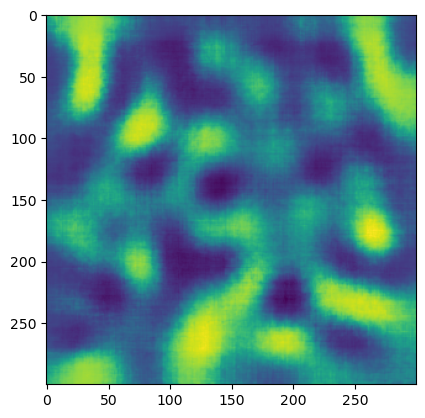

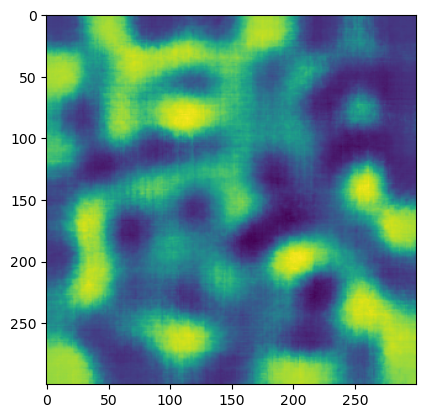

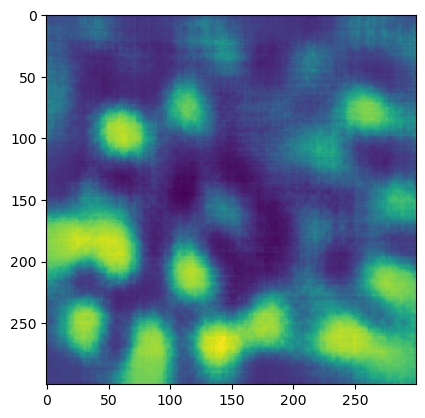

In [23]:
# look at single cell tuning curves
for i in range(0, embed_dim, 50):
    plt.imshow(encoded_Phi[:, :, i])
    plt.show()


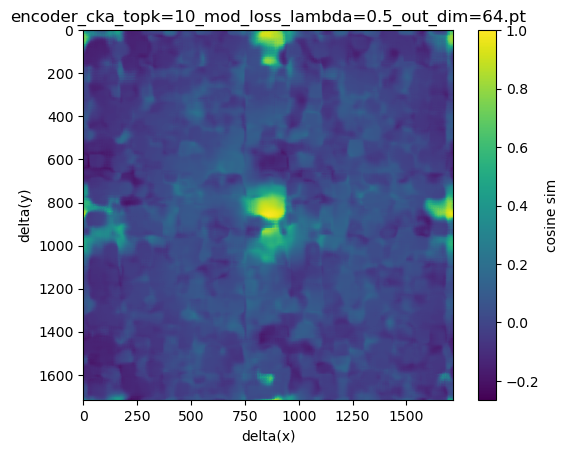

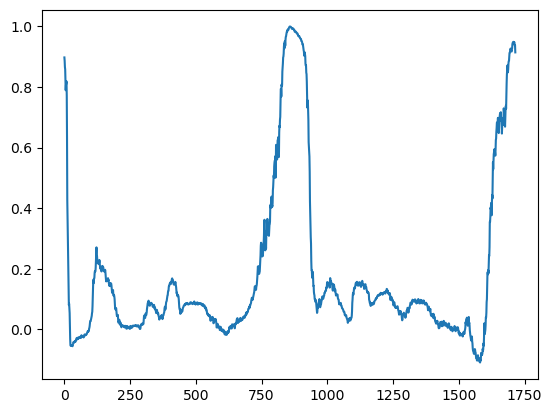

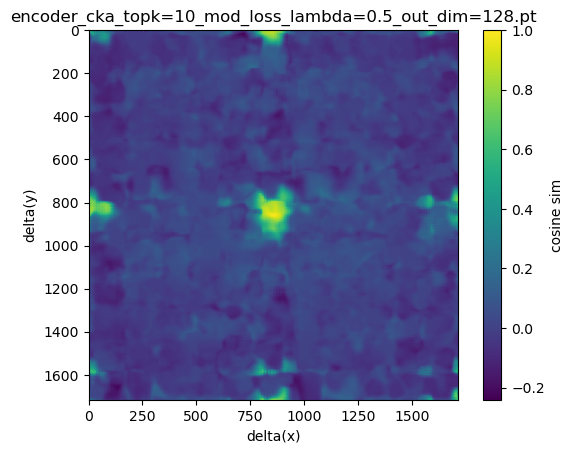

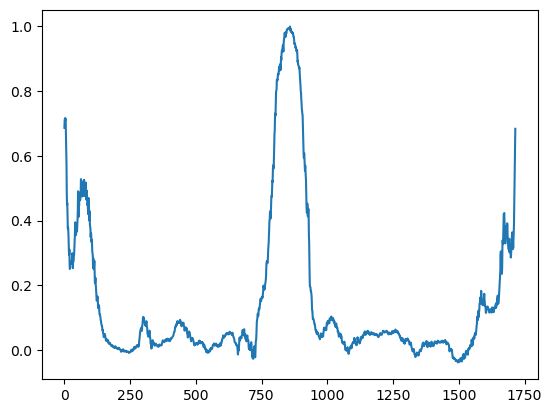

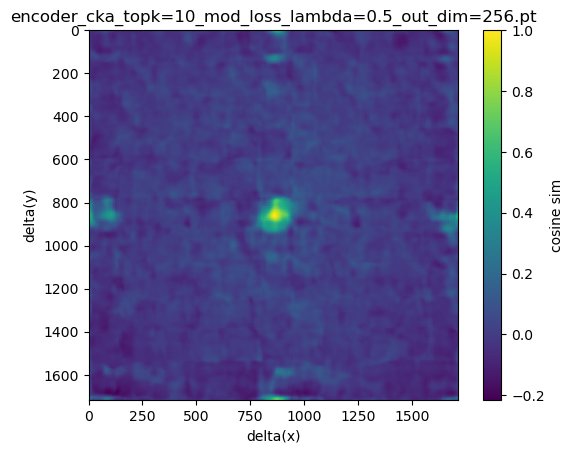

...

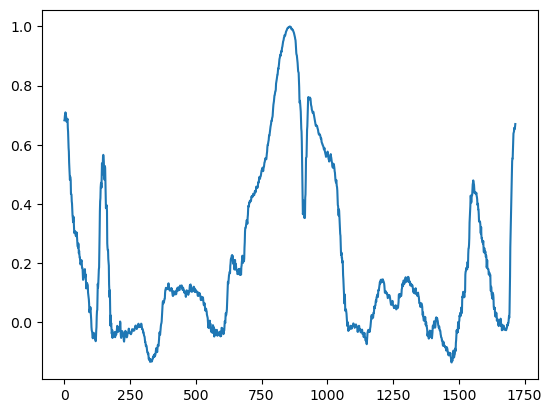

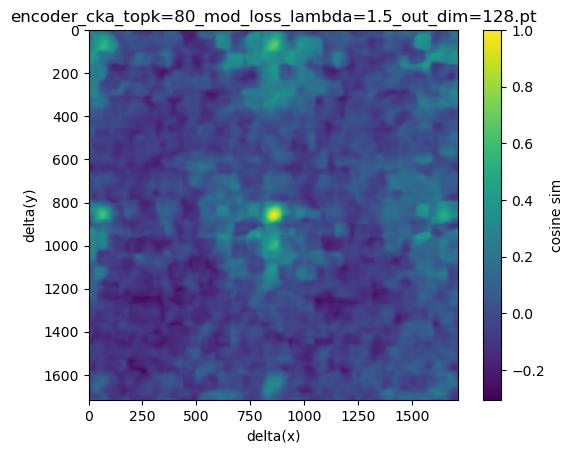

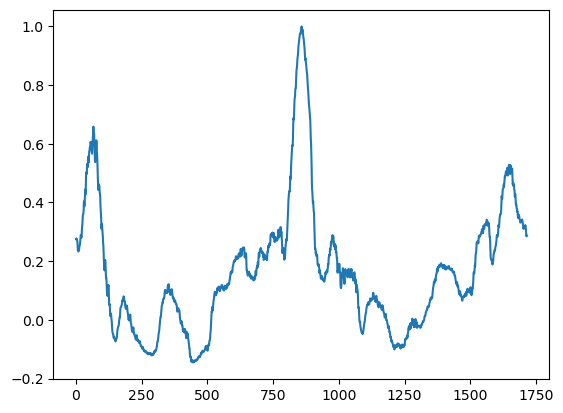

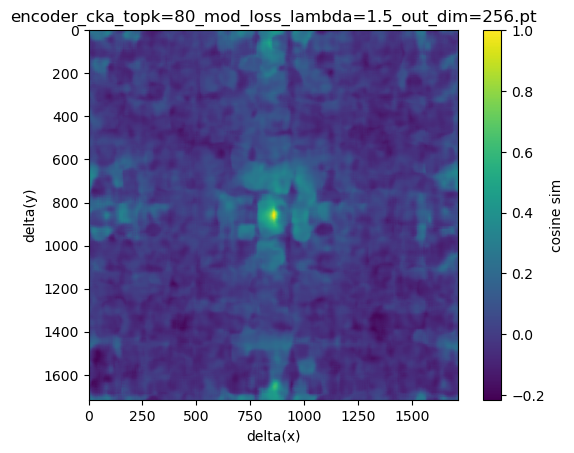

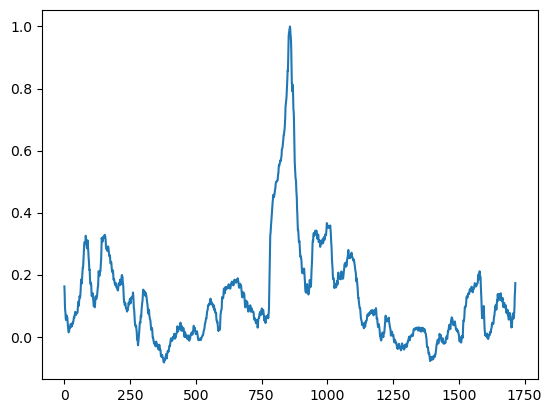

In [16]:
cka_topks = [10, 20, 40, 80]
mod_loss_lambdas = [0.5, 0.75, 1.0, 1.5]
out_dims = [64, 128, 256]

iterator = product(cka_topks, mod_loss_lambdas, out_dims)
for cka_topk, mod_loss_lambda, out_dim in iterator:
    encoder, config = load_encoder(f"encoder_cka_topk={cka_topk}_mod_loss_lambda={mod_loss_lambda}_out_dim={out_dim}.pt")

    gain = config["model_params"]["gain"]
    embed_dim = config["model_params"]["out_dim"]

    code_dim, H, W = Phi.shape
    Phi_flat = Phi.reshape(code_dim, H*W).T.to(device)
    batch_size = 1000  # adjust as needed according to GPU/CPU RAM constraints
    encoded_Phi_chunks = []
    with torch.no_grad():
        for i in range(0, Phi_flat.shape[0], batch_size):
            encoded_chunk = encoder(Phi_flat[i:i+batch_size], gain=gain).detach().cpu()
            encoded_Phi_chunks.append(encoded_chunk)
    encoded_Phi = torch.cat(encoded_Phi_chunks, dim=0)
    encoded_Phi = encoded_Phi.reshape(Npos, Npos, embed_dim).to("cpu").numpy()

    idx_y = Npos // 2
    idx_x = Npos // 2

    phix = encoded_Phi[idx_y, idx_x, :]

    #vectorized version
    cosine_sims = np.sum(encoded_Phi * phix, axis=-1) / np.sqrt(np.sum(encoded_Phi**2, axis=-1) * np.sum(phix**2, axis=-1))
    plt.imshow(cosine_sims)

    # Add circle marker at the reference point
    # plt.scatter(idx_x, idx_y, s=100, facecolors='none', edgecolors='red', linewidths=2, marker='o')

    plt.title(f"encoder_cka_topk={cka_topk}_mod_loss_lambda={mod_loss_lambda}_out_dim={out_dim}.pt")
    plt.xlabel("delta(x)")
    plt.ylabel("delta(y)")
    plt.colorbar(label="cosine sim")
    ax = plt.gca()
    ax.ticklabel_format(axis='y', style='plain', useOffset=False)
    ax.yaxis.get_offset_text().set_visible(False)
    plt.show()

    plt.plot(cosine_sims[idx_y])
    plt.show()